In [1]:
%matplotlib inline
# %matplotlib widget
import numpy as np
from matplotlib import pyplot as plt
import copy
import glob
from scipy import misc
import cv2

In [2]:
default_config = {
    'reference': {
        'tau': 20.0, # frames
        'dec': np.exp(-1.0 / 40.0), # frames
    },
    'threshold':{
        'tau': 10.0, # frames
        'dec': np.exp(-1.0 / 5.0 ), # frames
        'increment': 1.3, # mult
        'base': 0.05, # v
    },
    'range':{
        'minimum': 0.0, # v
        'maximum': 1.0, # v
    },
    'spike_on_positive_dv': True,
}

def get_params(config):
    global default_config
    dc = default_config

    ref_dec = config.get('reference', dc['reference'])['dec']
    thr_inc = config.get('threshold', dc['threshold'])['increment']
    thr_dec = config.get('threshold', dc['threshold'])['dec']
    thr0 = config.get('threshold', dc['threshold'])['base']
    vmin = config.get('range', dc['range'])['minimum']
    vmax = config.get('range', dc['range'])['maximum']
    
    return ref_dec, thr_inc, thr_dec, thr0, vmin, vmax
    
def nvs(val, ref, thr, config=default_config):
    if 'spike_on_positive_dv' in config:
        pos_dv = config['spike_on_positive_dv']
    else:
        pos_dv = True
    
    ref_dec, thr_inc, thr_dec, thr0, vmin, vmax = \
        get_params(config)
    
    ref0 = vmin if pos_dv else vmax
    
    dv = val - ref
    
    ref = np.clip(ref0 + (ref - ref0) * ref_dec, vmin, vmax)
        
    dvp = dv >= thr
    dvn = dv <= -thr
#     spiked = False
    spk = np.where(np.logical_or(dvp, dvn))
    thr[spk] *= thr_inc # scalar
    ref[spk] += dv[spk]
    if pos_dv:
        spiked = dvp * dv
    else:
        spiked = dvn * dv

    thr = np.clip(thr0 + (thr - thr0) * thr_dec, thr0, vmax)
    
    return ref, thr, spiked

def experiment(vin, cfg_p, cfg_n):
    v = np.asarray(vin)
    refp = np.array([0.0])
    thrp = np.array([0.05])
    refp_history = [refp]
    spike_p_t = []

    refn = np.array([1.0])
    thrn = np.array([0.05])
    refn_history = [refn]
    spike_n_t = []

    ref = (refp + refn) * 0.5 + np.random.uniform(-thrn, thrn)
    ref_history = [ref]
    for t, val in enumerate(v):

        refp, thrp, spike_p = nvs(val, refp, thrp, cfg_p)
        refn, thrn, spike_n = nvs(val, refn, thrn, cfg_n)

        if spike_p > 0.0:
            spike_p_t.append(t)

        elif spike_n < 0.0:
            spike_n_t.append(t)

        refp_history.append(refp)
        refn_history.append(refn)

        ref_history.append( (refp + refn) * 0.5 )

    data = dict(
        spike_p_t = np.asarray(spike_p_t),
        spike_n_t = np.asarray(spike_n_t),
        ref_history = np.asarray(ref_history),
        refp_history = np.asarray(refp_history),
        refn_history = np.asarray(refn_history),
    )

    return data


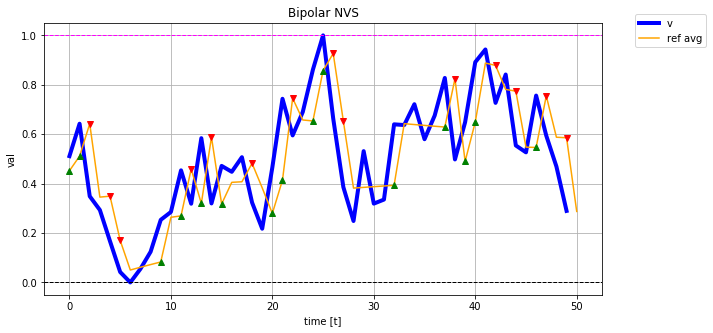

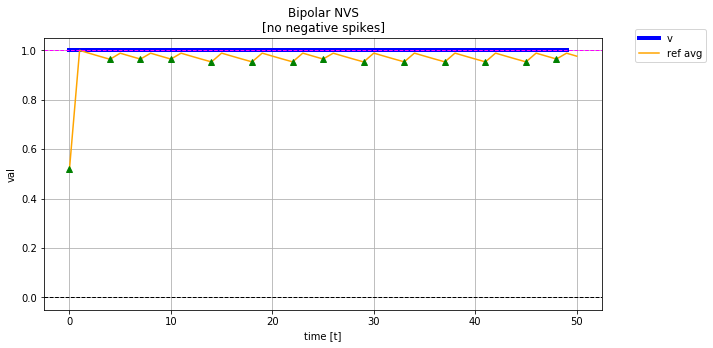

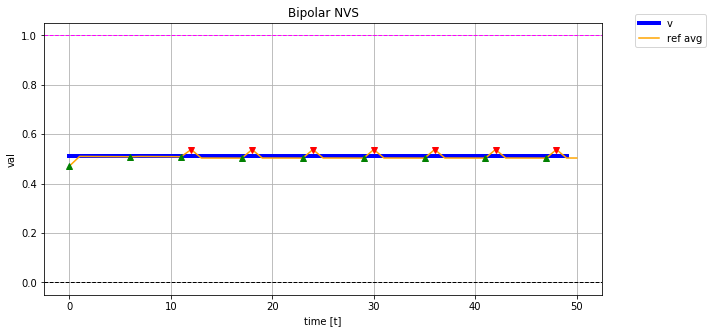

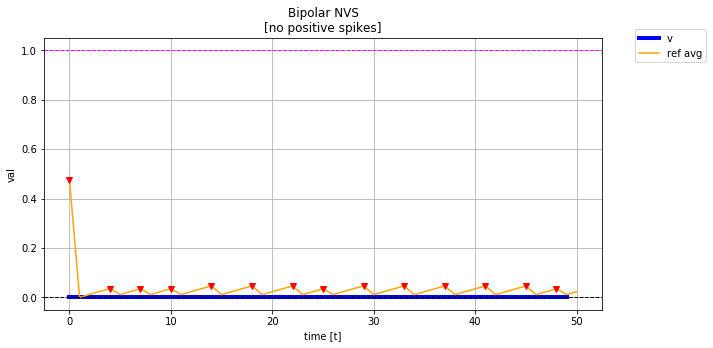

In [3]:
colors = [
    'red',
    'green',
    'blue',
    'orange',
    'gray',
    'magenta',
    'cyan',
]
seed = 1
n_samples = 50
np.random.seed(seed)
# v = np.random.uniform(0., 1., size=n_samples)
vv = np.random.uniform(-1., 1., size=n_samples)
for t in range(1, n_samples):
    vv[t] = vv[t-1] * 0.75 + vv[t]
vv -= vv.min()
vv *= 1./vv.max()

vs = [
    vv, 
    1.0 * np.ones(n_samples),
    0.51 * np.ones(n_samples),
    np.zeros(n_samples),
]


cfg_p = copy.copy(default_config)
cfg_n = copy.copy(default_config)
cfg_n['spike_on_positive_dv'] = False

for v in vs:
    d = experiment(v, cfg_p, cfg_n)
    ref_history = d['ref_history']
    spike_p_t = d['spike_p_t']
    spike_n_t = d['spike_n_t']

    fw = 5
    plt.figure(figsize=(2.0 * fw, fw))
    ax = plt.subplot(1, 1, 1)
    
    title = 'Bipolar NVS'

    plt.plot(v, label='v', color=colors[2], linewidth=4)

    plt.plot(ref_history[0:], '-', label='ref avg', color=colors[3])
    try:
        plt.plot(spike_p_t, ref_history[spike_p_t], linestyle='none', marker='^', color='green')
    except:
        title += '\n[no positive spikes]'
    try:
        plt.plot(spike_n_t, ref_history[spike_n_t], linestyle='none', marker='v', color='red')
    except:
        title += '\n[no negative spikes]'

    ax.set_title(title)
    ax.set_xlabel('time [t]')
    ax.set_ylabel('val')
    plt.axhline(1, linestyle='--', color='magenta', linewidth=1)
    plt.axhline(0, linestyle='--', color='black', linewidth=1)
    plt.legend(bbox_to_anchor=(1.05, 1.05))
    plt.grid()
    plt.show()

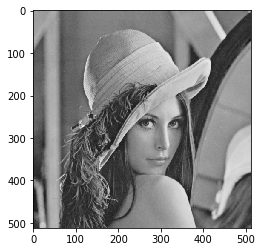

In [4]:
ARED, ABLUE = 0.299, 0.114
AGREEN = 1.0 - ARED - ABLUE

image_files = sorted( glob.glob('../test_images/*.png') )
img = cv2.cvtColor( cv2.imread(image_files[0]), cv2.COLOR_BGR2RGB ).astype('float')
img *= 1./255.0
img = ARED * img[:, :, 0] + AGREEN * img[:, :, 1] + ABLUE * img[:, :, 2]

# img = misc.face(gray=True).astype('float')
# img *= 1./255.0

plt.figure()
plt.imshow(img, cmap='gray', vmin=0, vmax=1)
plt.show()

(-1, -1)


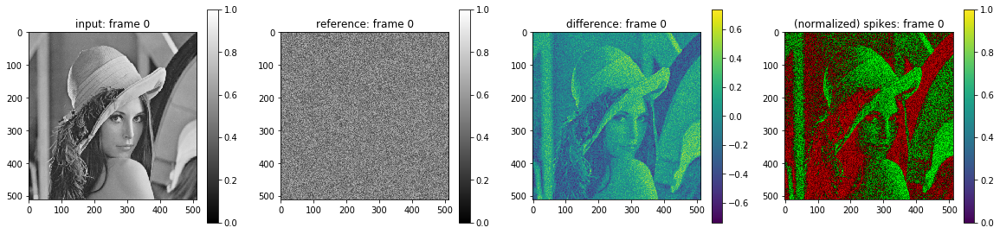

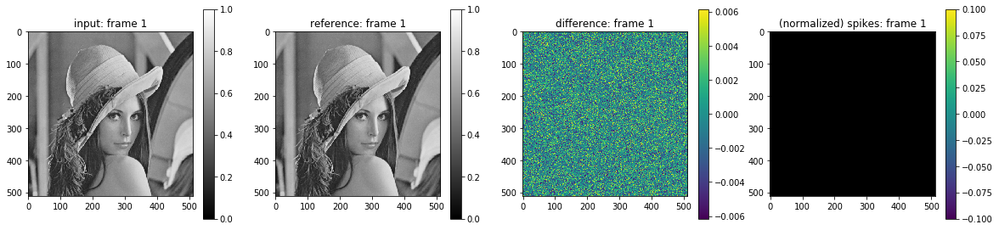

(-1, -1)


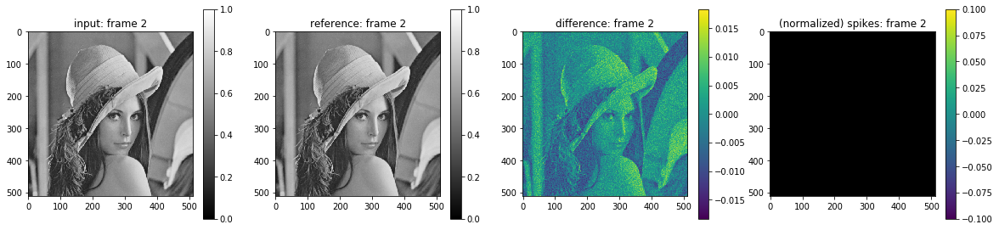

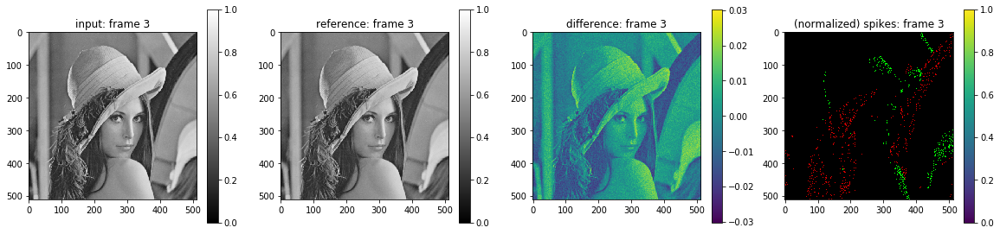

(1, 2)


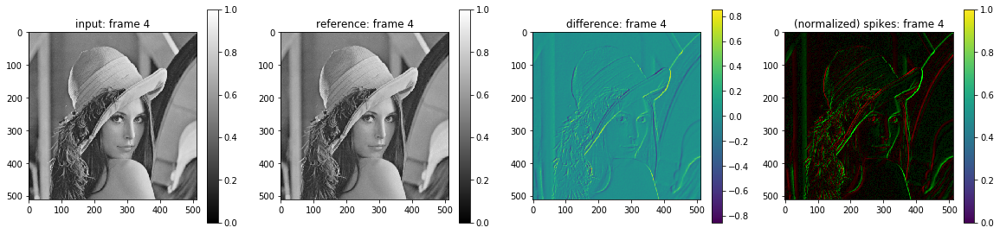

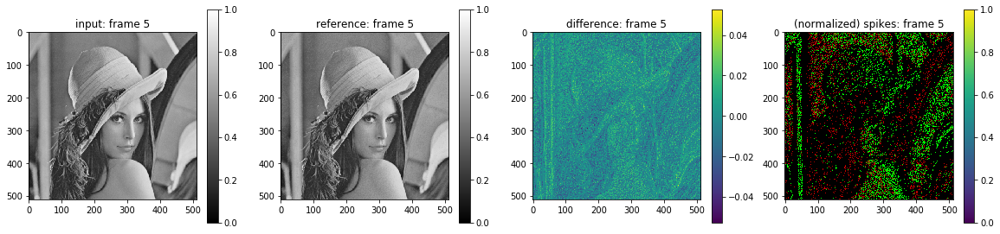

(-1, -1)


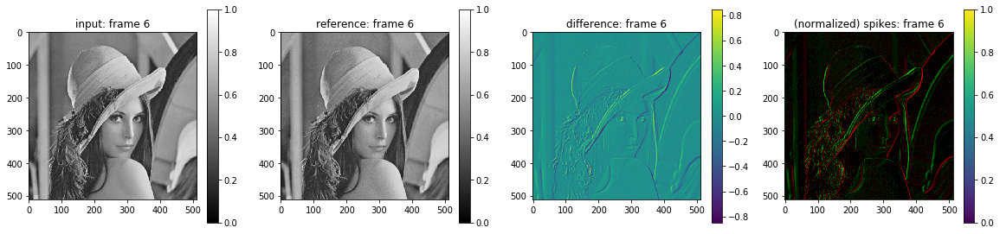

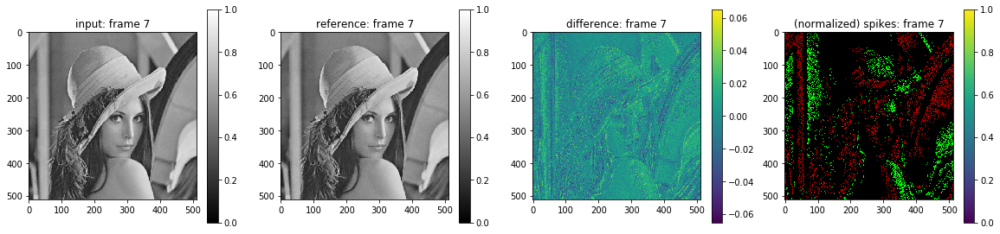

(1, 0)


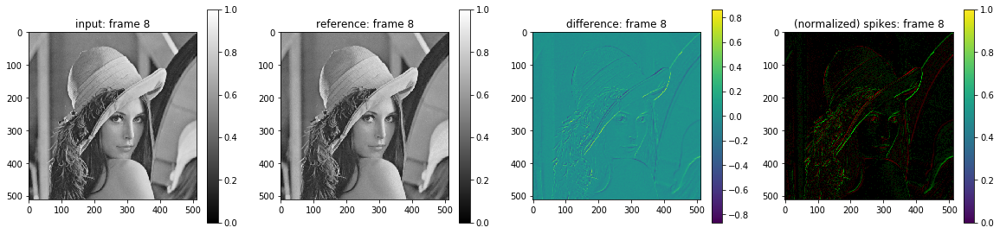

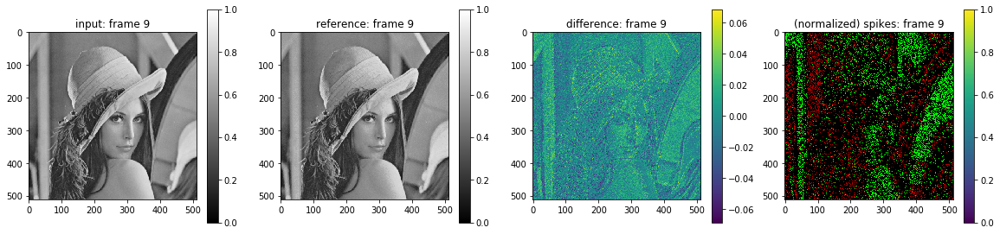

(-2, 0)


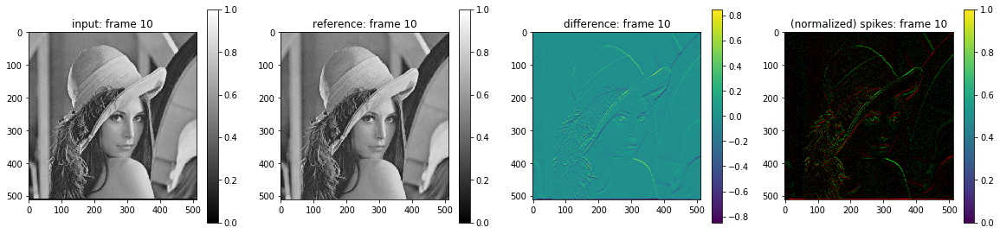

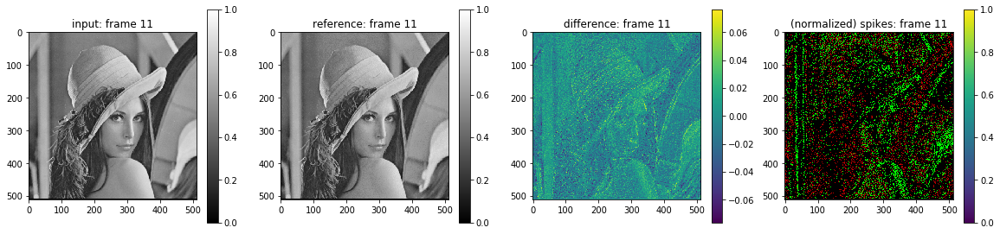

(-1, -2)


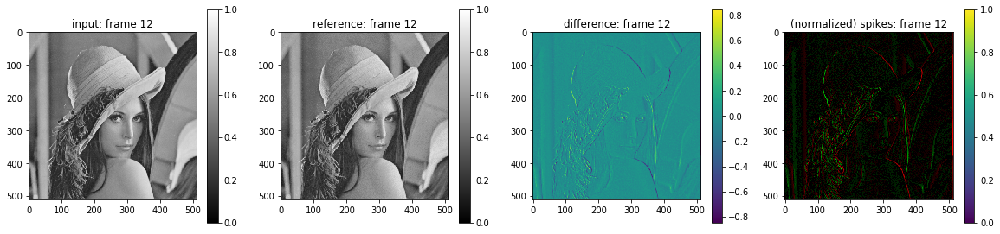

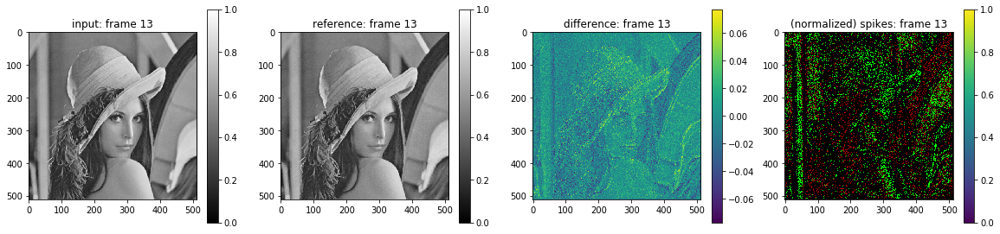

(1, -2)


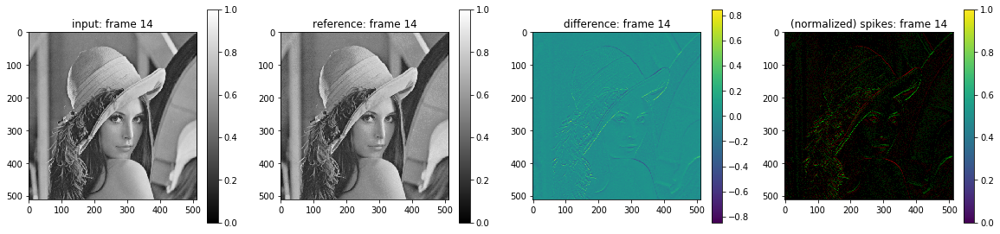

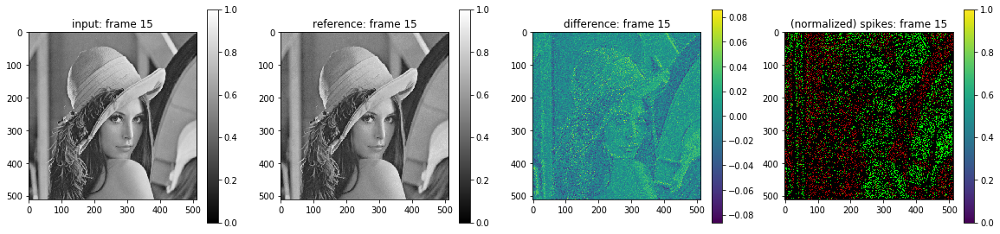

(-2, 0)


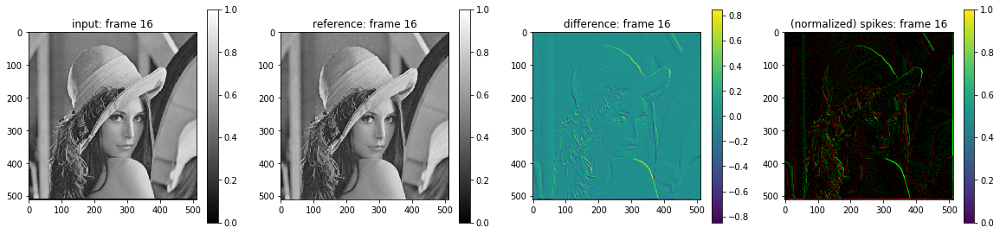

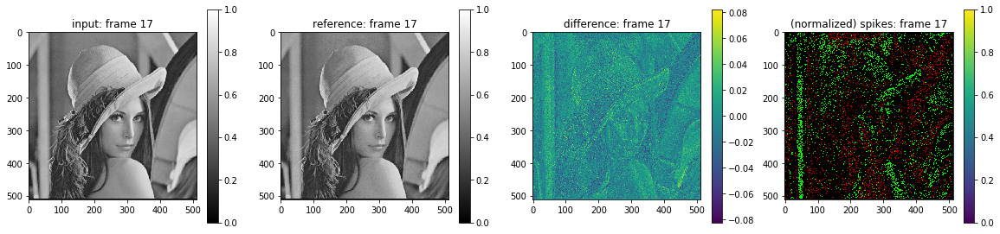

(0, -1)


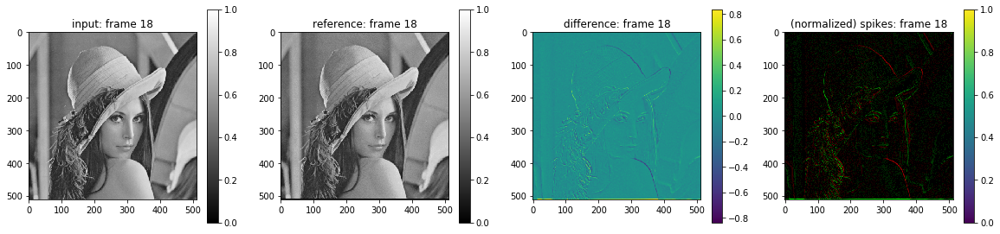

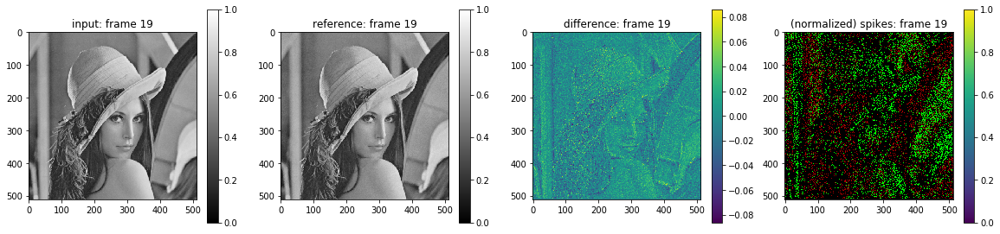

(0, 2)


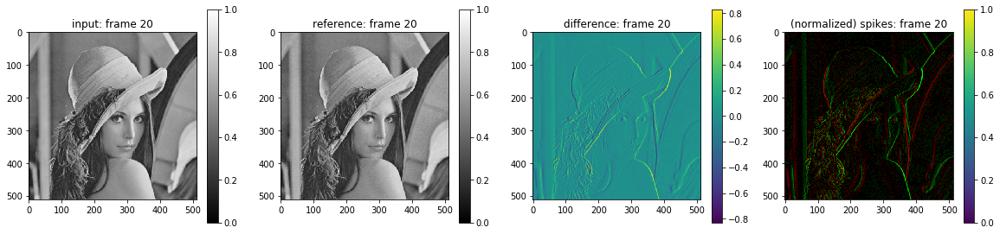

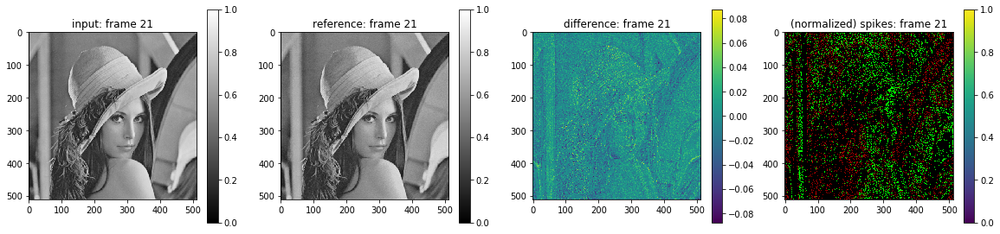

(-1, 2)


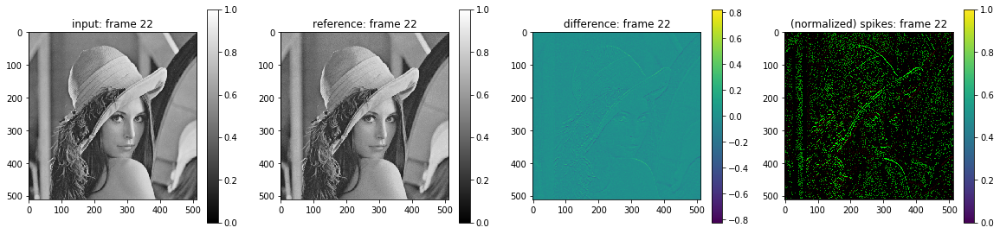

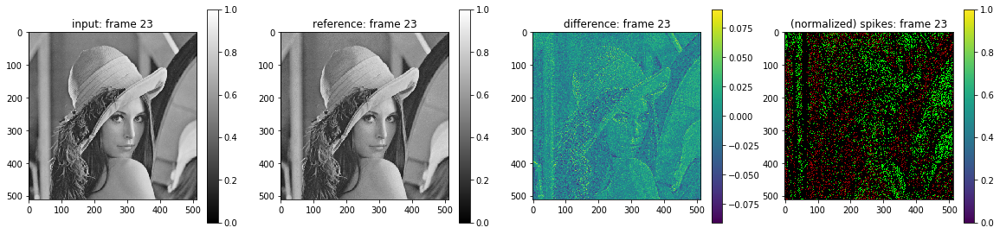

(-2, 0)


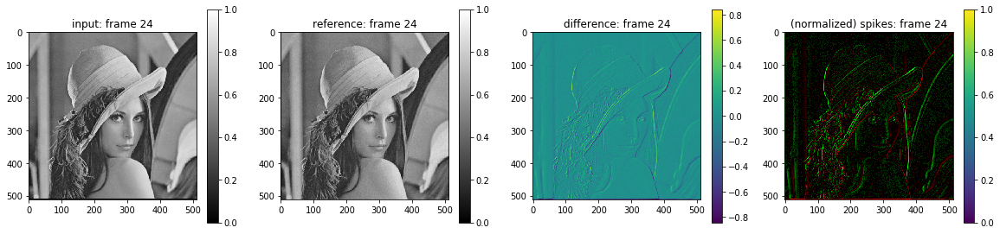

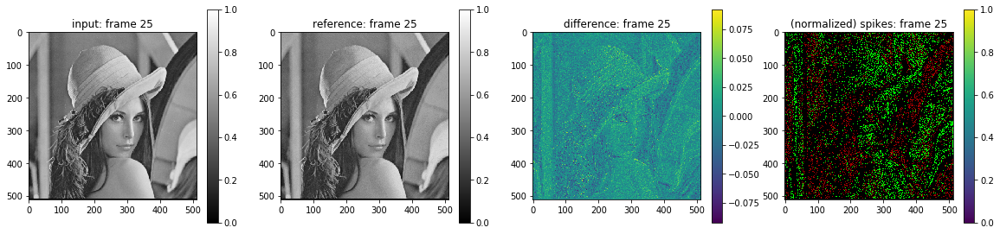

(0, 1)


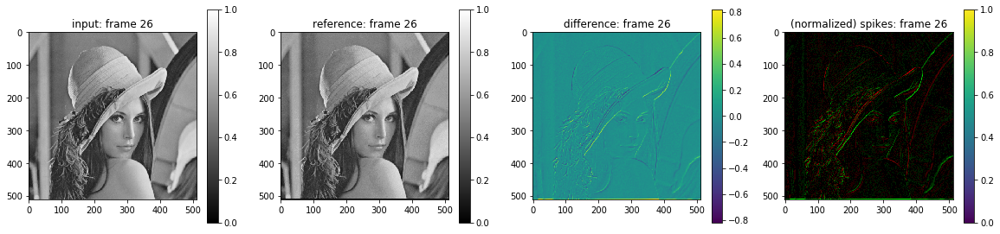

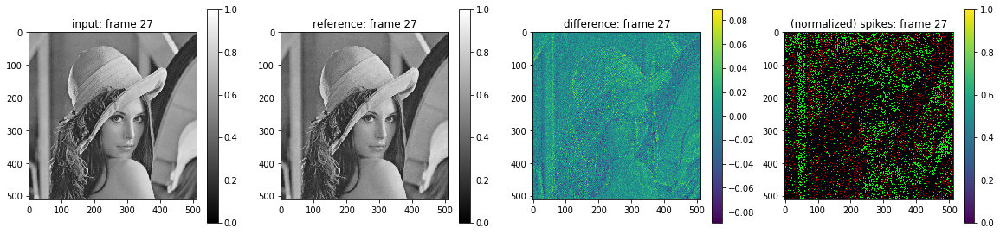

(-1, -1)


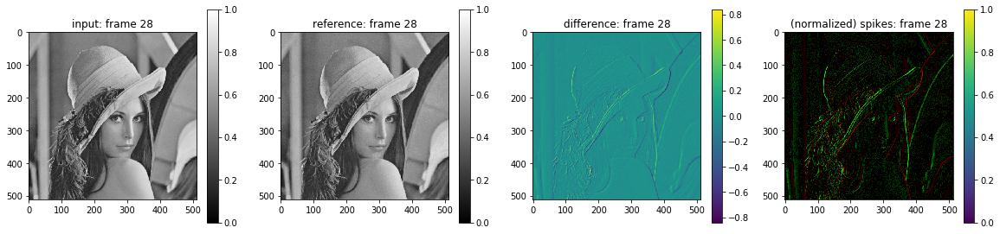

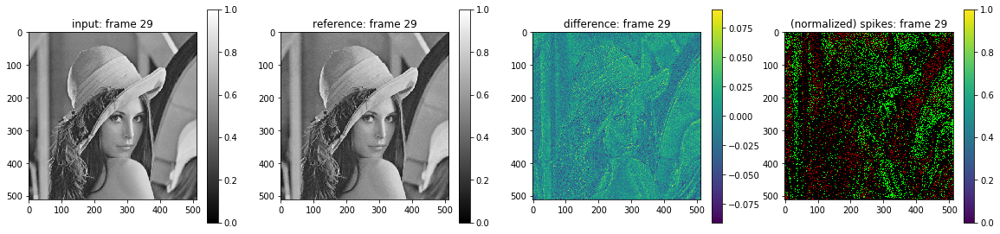

(1, 1)


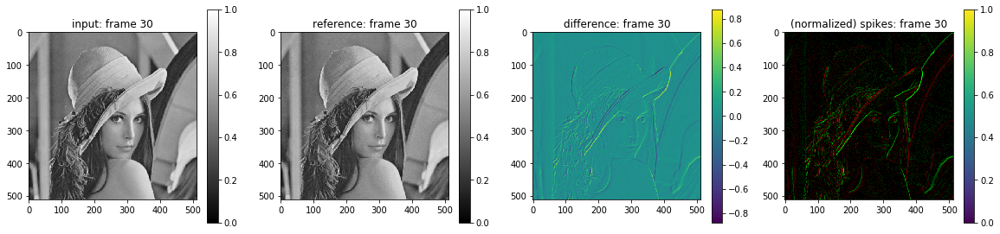

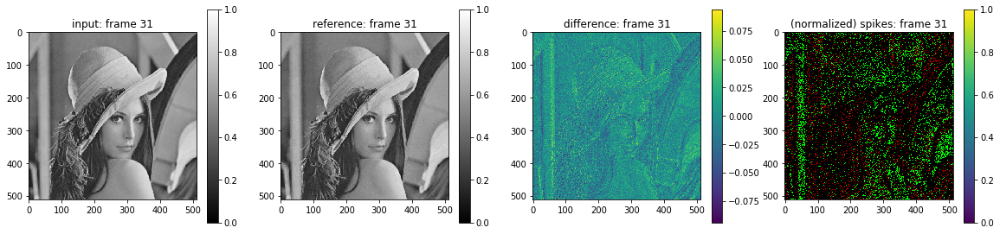

(-1, -1)


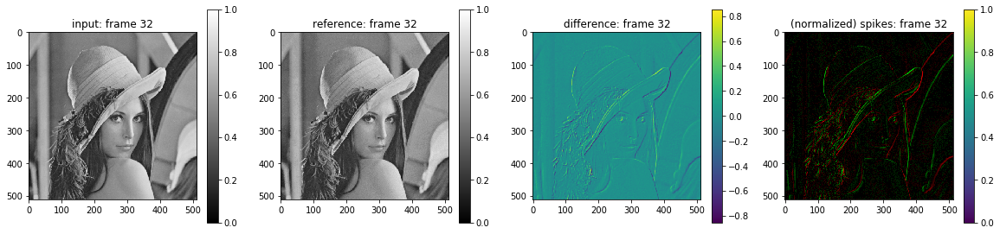

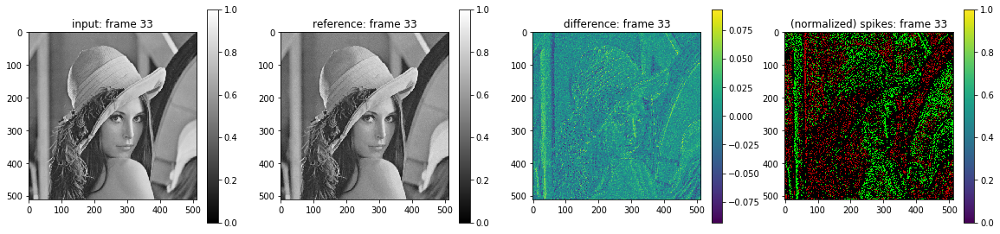

(1, 1)


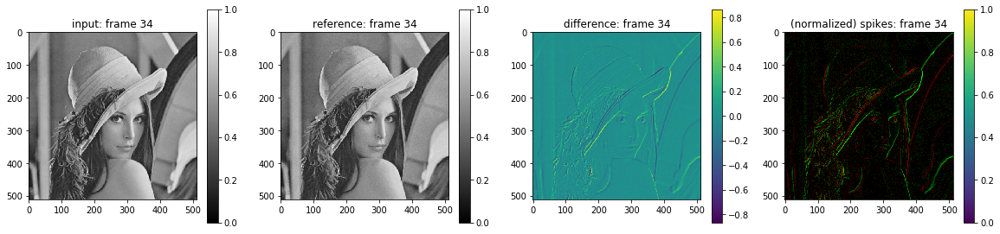

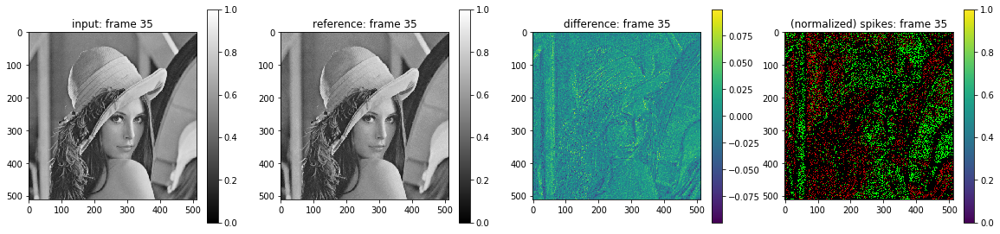

(1, 0)


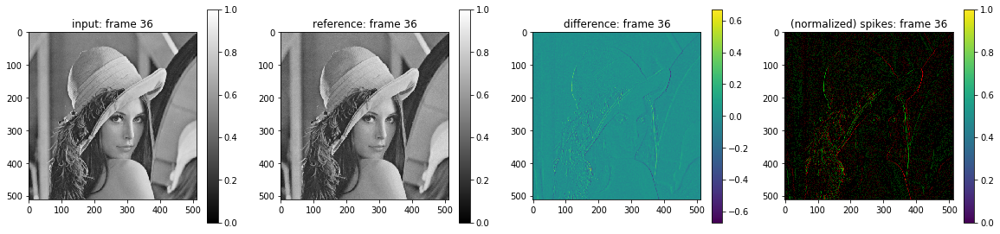

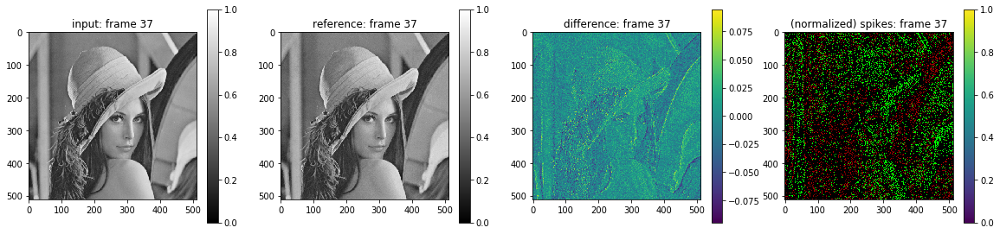

(0, -1)


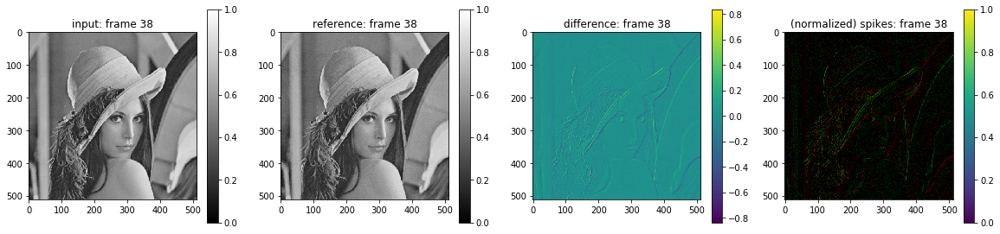

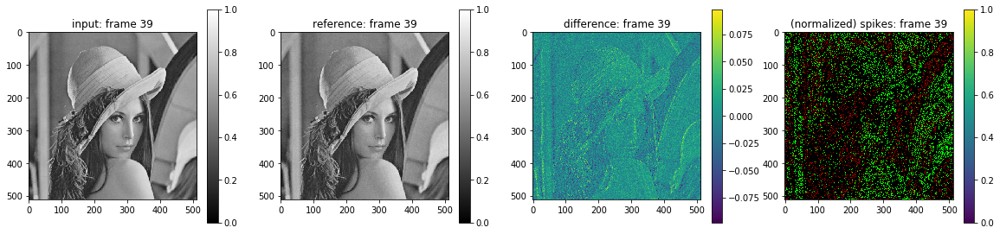

(-2, 1)


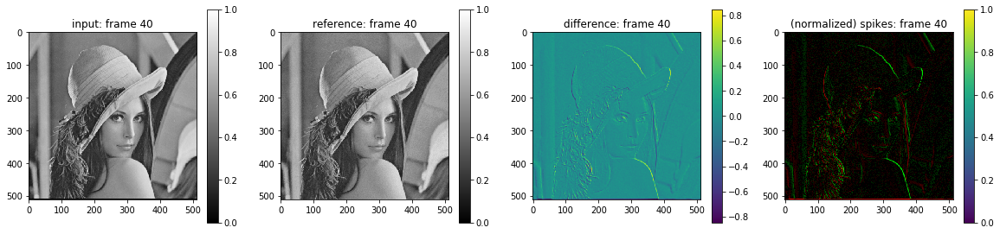

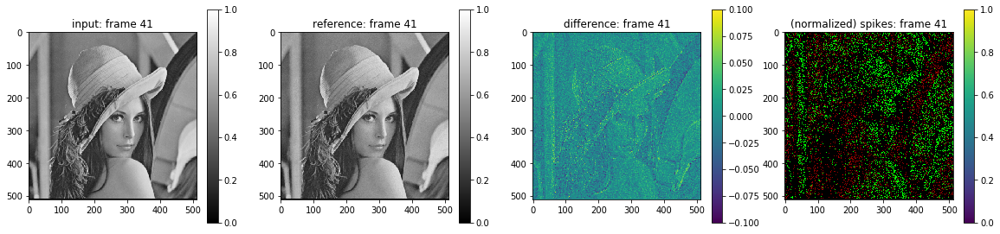

(1, -2)


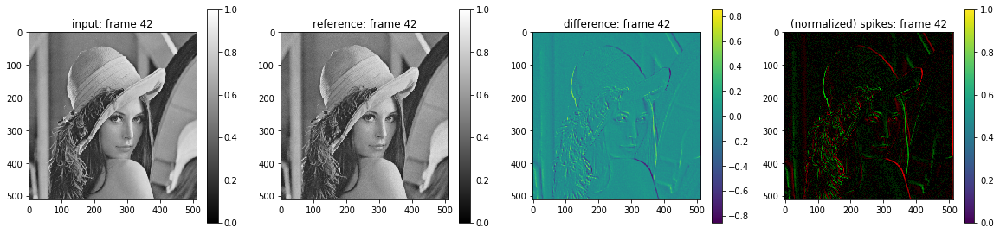

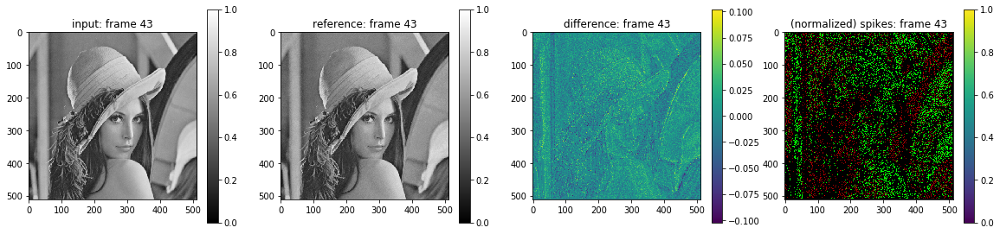

(-2, -1)


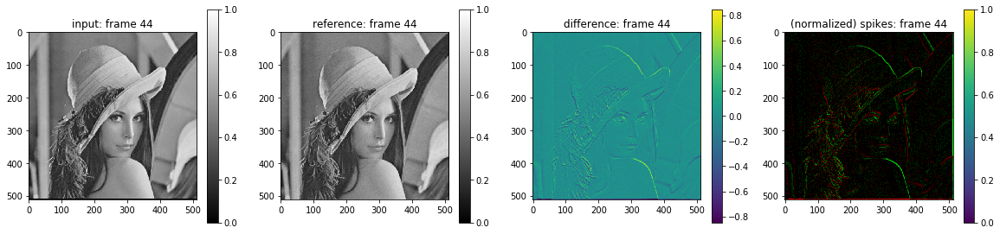

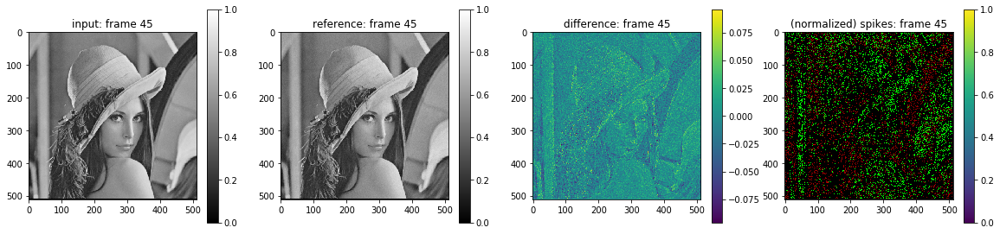

(1, -1)


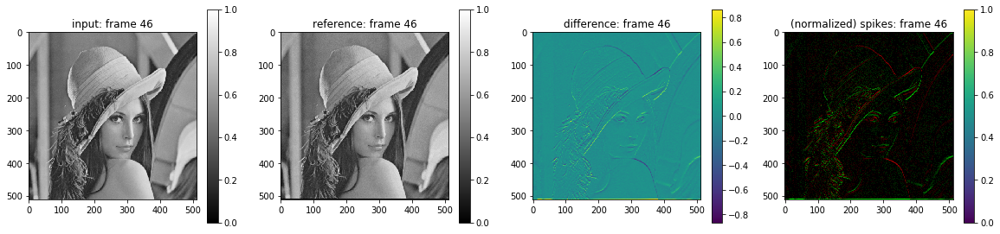

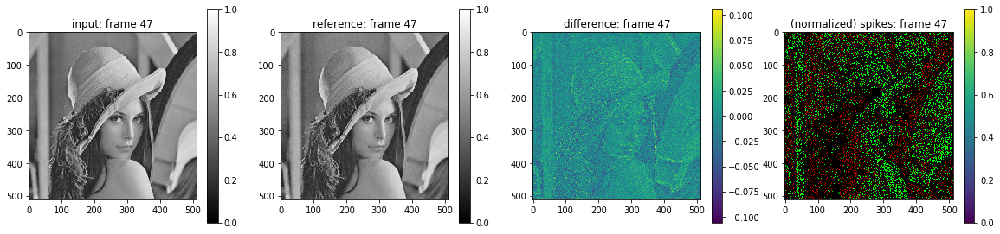

(-1, 0)


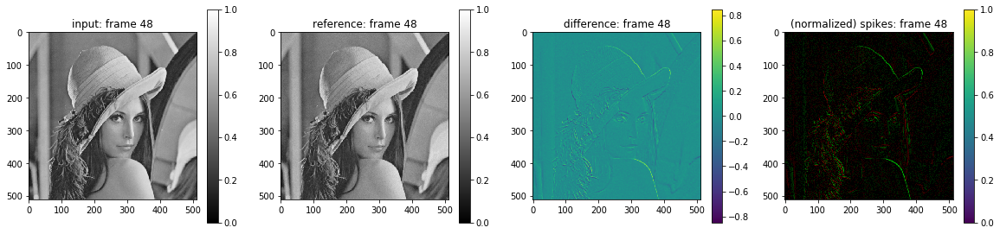

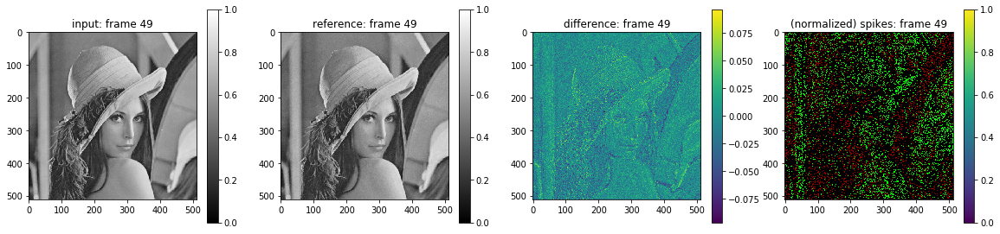

In [5]:
def get_range_tgt(dx, size):
    return max(0, dx), min(size + dx, size)

def get_range_src(dx, size):
    return max(0, -dx), min(size - dx, size)

prv = img.copy()
src = img.copy()
diff = np.zeros_like(img)
ref = np.zeros_like(img)
refp = np.random.uniform(0., 0.5, size=img.shape)
# refp = np.zeros_like(img)
thrp = 0.05 * np.zeros_like(img)
refn = np.random.uniform(0.5, 1., size=img.shape)
# refn = np.ones_like(img)
thrn = 0.05 * np.zeros_like(img)
cfg_p = copy.copy(default_config)
cfg_n = copy.copy(default_config)
cfg_n['spike_on_positive_dv'] = False

rows, cols = src.shape
spikes = np.zeros((rows, cols, 3))
n_samples = 50
fig_r = 2
fig_c = 4
fw = 5.0
static = bool(0)
shake_t = 2
for t in range(n_samples):

    if not static and (t%shake_t) == 0:
        [dr, dc] = np.round(np.random.uniform(-1., 1., size=2) * 2.0).astype('int')
        print(dr, dc)
        fr0, tr0 = get_range_src(dr, rows)
        fc0, tc0 = get_range_src(dc, cols)

        fr1, tr1 = get_range_tgt(dr, rows)
        fc1, tc1 = get_range_tgt(dc, cols)

        src[:] = 0
        src[fr1 : tr1, fc1 : tc1] = img[fr0 : tr0, fc0 : tc0]

    ref[:] = (refp + refn) * 0.5
    diff[:] = src - ref
    
    refp[:], thrp[:], spike_p = nvs(src, refp, thrp, config=cfg_p)
    refn[:], thrn[:], spike_n = nvs(src, refn, thrn, config=cfg_n)

#     spikes[:, :, 0] = src
#     spikes[:, :, 1] = src
#     spikes[:, :, 2] = src
    spikes[:] = 0

    wp = np.where(np.logical_and(spike_p > 0, spike_p > -spike_n))
    maxp = np.max(spike_p[wp]) if len(wp[0]) else 0
    n_spike_p = spike_p if maxp <= 0. else spike_p / maxp
    spikes[wp[0], wp[1], 0] = 0
    spikes[wp[0], wp[1], 1] = 0
    spikes[wp[0], wp[1], 2] = 0
    spikes[wp[0], wp[1], 1] = np.clip(n_spike_p[wp]/maxp, 0., 1.)

    wn = np.where(np.logical_and(spike_n < 0, spike_p < -spike_n))
    maxn = np.max(-spike_n[wn]) if len(wn[0]) else 0
    n_spike_n = spike_n if maxn <= 0. else spike_n / maxn
    spikes[wn[0], wn[1], 0] = 0
    spikes[wn[0], wn[1], 1] = 0
    spikes[wn[0], wn[1], 2] = 0
    spikes[wn[0], wn[1], 0] = np.clip(-n_spike_n[wn], 0., 1.)
    
    plt.figure(figsize=(fig_c * fw,  fig_r * fw))

    base = 0#t * fig_c
    ax = plt.subplot(fig_r, fig_c, base + 1)
    ax.set_title('input: frame %d'%t)
    im = plt.imshow(src, cmap='gray', vmin=0, vmax=1)
    plt.colorbar(im)

    ax = plt.subplot(fig_r, fig_c, base + 2)
    ax.set_title('reference: frame %d'%t)
    im = plt.imshow(ref, cmap='gray', vmin=0, vmax=1)
    plt.colorbar(im)

    ax = plt.subplot(fig_r, fig_c, base + 3)
    ax.set_title('difference: frame %d'%t)
    vmax = np.abs(diff).max()
    im = plt.imshow(diff, vmin=-vmax, vmax=vmax)
    plt.colorbar(im)
    
    ax = plt.subplot(fig_r, fig_c, base + 4)
    ax.set_title('(normalized) spikes: frame %d'%t)
    im = plt.imshow(spikes)
    plt.colorbar(im)

    plt.show()